In [1]:
import os
import csv
import json
from typing import List, Dict, Any
import fitz  # PyMuPDF
from groq import Groq
import pandas as pd
import chardet

In [2]:
def groq_response(question):
    response = client.chat.completions.create(
        messages=[
            {
                "role": "user",
                "content": question,
            }
        ],
        model="llama-3.1-70b-versatile",
        temperature=0.2,
        max_tokens=2000,
    )
    return response.choices[0].message.content


def extract_text_from_pdf(pdf_path: str) -> str:
    """Extract text from a PDF file."""
    try:
        doc = fitz.open(pdf_path)
        text = ""
        for page in doc:
            text += page.get_text()
        return text
    except Exception as e:
        print(f"Error extracting text from PDF {pdf_path}: {str(e)}")
        return ""

def read_file_with_auto_detect(file_path):
    """Read a file with automatic encoding detection."""
    with open(file_path, 'rb') as file:
        raw_data = file.read()
    
    detected = chardet.detect(raw_data)
    encodings = [detected['encoding'], 'utf-8', 'latin-1', 'ascii']
    
    for encoding in encodings:
        try:
            return raw_data.decode(encoding)
        except UnicodeDecodeError:
            continue
    
    # If all else fails, return the raw bytes as a string
    return str(raw_data)

In [3]:
# def compare_resume_and_recommendations(resume_analysis: Dict[str, Any], recommendation_analyses: List[Dict[str, Any]]) -> Dict[str, Any]:
#     """Compare resume content with recommendation letters and generate a fraud score."""
#     prompt = f"""
#     Compare the following resume analysis with the analyses of recommendation letters:

#     Resume: {json.dumps(resume_analysis)}

#     Recommendation Letters: {json.dumps(recommendation_analyses)}

#     Please identify and provide a detailed analysis on:
#     1. Discrepancies between resume claims and recommendation letters
#        - Example: Resume claims "Led a team of 50", but letters mention "small team management"
#     2. Exaggerated claims across all documents
#        - Look for inconsistent numbers, achievements, or roles
#     3. Suspicious or vague wording
#        - Example: Overuse of terms like "innovative", "groundbreaking" without specific examples
#     4. Consistency of skills, experiences, and achievements mentioned
#     5. Any missing corroboration of key resume claims in the letters

#     Based on your analysis, generate a fraud score from 0 to 100, where:
#     0-20: Highly consistent and credible
#     21-40: Generally consistent with minor discrepancies
#     41-60: Some concerning inconsistencies or exaggerations
#     61-80: Significant discrepancies or potential misrepresentations
#     81-100: Highly suspicious with major inconsistencies or likely fraudulent claims

#     Explain your reasoning for the score.

#     Return the analysis and score as a JSON object.
#     """

#     response = client.chat.completions.create(
#         messages=[
#             {
#                 "role": "user",
#                 "content": prompt,
#             }
#         ],
#         model="llama2-70b-4096",
#         temperature=0.2,
#         max_tokens=2000,
#     )

#     return json.loads(response.choices[0].message.content)


In [4]:
def detect_circular_endorsements(user_id: str, recommender_ids: List[str], endorsement_data: Dict[str, List[str]]) -> List[str]:
    """Detect circular endorsements."""
    circular_endorsements = []
    for recommender_id in recommender_ids:
        if recommender_id in endorsement_data:
            if user_id in endorsement_data[recommender_id]:
                circular_endorsements.append(recommender_id)
    return circular_endorsements

def load_endorsement_data(csv_path: str) -> Dict[str, List[str]]:
    """Load endorsement data from CSV file."""
    endorsement_data = {}
    with open(csv_path, 'r') as csvfile:
        reader = csv.reader(csvfile)
        next(reader)  # Skip header
        for row in reader:
            user_id, recommenders = row
            endorsement_data[user_id] = json.loads(recommenders.replace("'", '"'))
    return endorsement_data

In [5]:
resumes_dir = "Dataset/Final_Resumes"
recommendations_base_dir = "Dataset/Final_Recommendation_Letters"

endorsement_data = load_endorsement_data("./Dataset/Final_Persons_And_Recommenders.csv")

In [ ]:
resume_texts = {}
recommendation_texts = {}

In [96]:
for user_id in [str(i) for i in range(1000)]:
    if user_id not in resume_texts:
        resume_path = os.path.join(resumes_dir, f"Resume_of_ID_{user_id}.pdf")
        recommendation_dir = os.path.join(recommendations_base_dir, f"Recommendation_Letters_of_ID_{user_id}")
        if os.path.exists(resume_path):
            resume_texts[user_id] = extract_text_from_pdf(resume_path)
        else:
            resume_texts[user_id] = ""
        # recommendation_paths = {f.split('.')[0].split('_')[-1]:os.path.join(recommendation_dir, f) for f in os.listdir(recommendation_dir) if f.endswith('.txt')}
        # recommendation_text = {key:read_file_with_auto_detect(path) for key,path in recommendation_paths.items()}
        # recommendation_texts[user_id] = recommendation_text

In [97]:
len(resume_texts)

1000

In [7]:
prompt_for_resume_summary = """
You are an experienced Human Resources (HR) professional. Your task is to summarize the following Resume into the specified categories by providing simple descriptions for each label.

Categories to summarize:
1. Resume Summary: Provide a brief overview of the candidate's experience and skills.
2. Objective: Describe the candidate's career goals and the type of role they are seeking.
3. Experience: List the candidate's work experience, including job titles, companies, and key responsibilities.
4. Accomplishments: Highlight any notable achievements or awards the candidate has received.
5. Education: Include the candidate's educational background, such as degrees and institutions attended.
6. Projects: Mention any significant projects the candidate has worked on, including technologies used and outcomes.
7. Skills: List the candidate's technical skills and proficiencies.

Below is an example of how to format the summary:

---

Example:

1. Resume Summary: John Doe is a software engineer with 6 years of experience specializing in full-stack development, with strong expertise in JavaScript, React, and Node.js. He has worked at Google and Microsoft, delivering scalable web applications.

2. Objective: Seeking a senior software engineering role to lead development teams and build scalable web applications.

3. Experience: John has worked at Google from 2020 to present as a Senior Software Engineer, leading web application development using React and Node.js. Previously, he was a Software Engineer at Microsoft from 2016 to 2020, focusing on cloud services with Azure and Python.

4. Accomplishments: Increased website performance at Google by 35 percent. Received the Employee of the Year award at Microsoft in 2018.

5. Education: Bachelor of Science in Computer Science from MIT, graduated in 2015.

6. Projects: Developed an e-commerce platform using React and AWS in 2021. Created a real-time chat application using Node.js and WebSocket in 2020.

7. Skills: Proficient in React, Node.js, Python, AWS, Azure, and JavaScript.

---

Now, please apply this format to the following resume. For any category that doesn't have enough details, respond with "None."

Resume:  
{resume_text}
"""

In [8]:
import os
import time
from groq import Groq
client = Groq(api_key=os.getenv("key1"))

def groq_response(question: str) -> str:
    response = client.chat.completions.create(
        messages=[
            {
                "role": "user",
                "content": question,
            }
        ],
        model="llama-3.1-70b-versatile",  # Use Groq's Llama 3.1 70B model
        temperature=0.2,
        max_tokens=2000,
    )
    return response.choices[0].message.content


def generate_resume_summary(resume_text: str) -> str:
    """Generate a summarized resume using Groq."""

    try:
        # Format the prompt using the resume text
        prompt = prompt_for_resume_summary.format(resume_text=resume_text)
        # Call Groq API for summarization
        summary = groq_response(prompt)
        return summary.strip()
    except Exception as e:
        print(f"Error generating summary: {str(e)}")
        return "Error in generating summary"


In [11]:
resume_summaries = {}

In [98]:
for user_id, resume_text in resume_texts.items():
    if resume_text.strip():  # Skip empty resumes
        print(f"Processing resume for user ID: {user_id}")
        if user_id in resume_summaries:
            continue
        summary = generate_resume_summary(resume_text)
        resume_summaries[user_id] = summary
        time.sleep(0)  # Adjust based on API rate limits
    else:
        resume_summaries[user_id] = "No resume text available"

Processing resume for user ID: 0
Processing resume for user ID: 1
Processing resume for user ID: 2
Processing resume for user ID: 3
Processing resume for user ID: 4
Processing resume for user ID: 5
Processing resume for user ID: 6
Processing resume for user ID: 7
Processing resume for user ID: 8
Processing resume for user ID: 9
Processing resume for user ID: 10
Processing resume for user ID: 11
Processing resume for user ID: 12
Processing resume for user ID: 13
Processing resume for user ID: 14
Processing resume for user ID: 15
Processing resume for user ID: 16
Processing resume for user ID: 17
Processing resume for user ID: 18
Processing resume for user ID: 19
Processing resume for user ID: 20
Processing resume for user ID: 21
Processing resume for user ID: 22
Processing resume for user ID: 23
Processing resume for user ID: 24
Processing resume for user ID: 25
Processing resume for user ID: 26
Processing resume for user ID: 27
Processing resume for user ID: 28
Processing resume for us

In [245]:
df=pd.read_csv('/Users/kaisarimtiyaz/Desktop/ariesiitd/finals/INNOV8-2.0-Finals/resume_summaries.csv')

resume_summaries = df['Resume Summary'].tolist()

In [248]:
resume_summaries[0]

'1. Resume Summary: Dedicated and enthusiastic educator with over four years of experience in education, specializing in bilingual language arts and possessing strong communication skills to build trust among students, parents, and administrators.\n\n2. Objective: None.\n\n3. Experience: \n- Bilingual Language Arts Sixth Grade Teacher at Company Name (2014-Present): Developed and implemented interactive learning mediums, participated in intervention plans, and implemented educational technology programs.\n- Bilingual Substitute Teacher at Company Name (2014): Worked in elementary schools, provided support for teachers on leave, and substituted in various classroom programs.\n- Bilingual 4th Grade Teacher at Company Name (2013-2014): Developed and implemented lesson plans, analyzed data, and cooperated with staff in planning instructional goals.\n- Student Development Assistant at Company Name (2011-2012): Coordinated community tours, created data reports, and collaborated with the FWIS

In [246]:
import re

def extract_experience_field(resume_summaries: str) -> str:
    """
    Extracts the 'Experience' section from the resume summary.
    If no experience section is found, returns 'None'.
    """
    experience_section = re.search(r"3\. Experience:(.*?)(4\.|$)", resume_summaries, re.DOTALL)
    if experience_section:
        return experience_section.group(1).strip()
    return "None"  # Return 'None' if no experience section is found

In [252]:
# Create lists to store the extracted experience data
user_ids = []
experience_fields = []

# Process each resume summary and extract the 'Experience' section
for i in range(len(resume_summaries)):
    resume_summary = resume_summaries[i]
    
    # Extract the experience section
    experience = extract_experience_field(resume_summary)
    
    # Store the results
    user_ids.append(user_id)
    experience_fields.append(experience)

# Create a DataFrame to store the user ID and the extracted experience section
experience_df = pd.DataFrame({
    'experience': experience_fields
})

# Save the extracted experience to a CSV file
experience_df.to_csv('extracted_experience.csv', index=False)

print("Experience extraction completed and saved to 'extracted_experience.csv'.")

Experience extraction completed and saved to 'extracted_experience.csv'.


In [258]:
#view the 85 element of experienced_df
experience_df.iloc[85]

experience    - Purchaser/Production Coordinator at Flightst...
Name: 85, dtype: object

In [259]:
def groq_response(question: str) -> str:
    response = client.chat.completions.create(
        messages=[
            {
                "role": "user",
                "content": question,
            }
        ],
        model="llama-3.1-70b-versatile",  # Use Groq's Llama 3.1 70B model
        temperature=0.2,
        max_tokens=2000,
    )
    return response.choices[0].message.content

In [260]:
groq_prompt_template = """
You are an expert in analyzing career job experiences. Your task is to evaluate the total experience time and gap period based on the candidate’s job experience.

### Steps:
1. **Extract Dates**: For each job, extract the start and end dates. Treat present/current year as 2024).
   
2. **Calculate Experience**: 
    Example:
    Bilingual Language Arts Sixth Grade Teacher (2014-Present): 2024 - 2014 = 10 years
    Bilingual Substitute Teacher (2014): Same year, so 1 year.
    Bilingual 4th Grade Teacher (2013-2014): 2014 - 2013 = 1 year
    Student Development Assistant (2011-2012): 2012 - 2011 = 1 year
    Academic Advisor/Spanish Instructor (2010): Same year, so 1 year.
    Program Coordinator (2009-2010): 2010 - 2009 = 1 year
    Math Teacher (2009): Same year, so less than 1 year, but we'll count it as 1 year for simplicity.

    Total Professional Experience= (10+1+1+1+1+1+1) years = 16 

    DON'T MAKE AN ERROR WHILE CALCULATING EXPERIENCE TIME.
    
3. **Calculate Gaps**: 
    Example:
    Between Bilingual Language Arts Sixth Grade Teacher (2014-Present) and Bilingual Substitute Teacher (2014): No gap (same year).
    Between Bilingual Substitute Teacher (2014) and Bilingual 4th Grade Teacher (2013-2014): No gap (consecutive years).
    Between Bilingual 4th Grade Teacher (2013-2014) and Student Development Assistant (2011-2012): Gap between 2012 and 2013 = 1 year gap.
    Between Student Development Assistant (2011-2012) and Academic Advisor/Spanish Instructor (2010): No gap (consecutive years).
    Between Academic Advisor/Spanish Instructor (2010) and Program Coordinator (2009-2010): No gap (consecutive years).
    Between Program Coordinator (2009-2010) and Math Teacher (2009): No gap (same year).
   
    Total Gap Period= 0+0+1+0+0+0 = 1 year
    
    DON'T MAKE AN ERROR WHILE CALCULATING GAP PERIOD.
### Output:
Return results in this format:
- Total Experience Time: X years
- Gap Period: Y years

Now, analyze the following candidate's job experience:
{experience}
"""



#calculate total experience time and gap year time based on job experience

def calculate_experience_gap(experience: str) -> str:
    """Calculate total experience time and gap year time based on job experience."""
    # Format the prompt using the experience data
    prompt = groq_prompt_template.format(experience=experience)
    # Call Groq API for experience analysis
    response = groq_response(prompt)
    return response.strip()

# Create lists to store the calculated experience data
user_ids = []
total_experience_times = []
gap_periods = []

In [278]:
from dotenv import load_dotenv
load_dotenv()
client = Groq(api_key=os.getenv("key10"))

In [279]:
# Process each job experience and calculate the total experience time and gap year time
for i in range(len(experience_df)):
    
    #if index is found in the user_ids list, skip those indexes and calculate the rest
    if i in user_ids:
        continue
    user_id = experience_df.index[i]
    experience = experience_df['experience'][i]
    
    # Calculate the total experience time and gap year time
    result = calculate_experience_gap(experience)
    
    # Extract the total experience time and gap period from the result
    total_experience_time = re.search(r"Total Experience Time: (\d+)", result)
    gap_period = re.search(r"Gap Period: (\d+)", result)
    
    # Store the results with '0' if no value is found
    user_ids.append(user_id)
    total_experience_times.append(total_experience_time.group(1) if total_experience_time else "0")
    gap_periods.append(gap_period.group(1) if gap_period else "0")
    
    # Print the results in real-time
    print(f"User ID: {user_id}, Total Experience Time: {total_experience_time.group(1) if total_experience_time else '0'}, Gap Period: {gap_period.group(1) if gap_period else '0'}")

User ID: 855, Total Experience Time: 16, Gap Period: 6
User ID: 856, Total Experience Time: 5, Gap Period: 0
User ID: 857, Total Experience Time: 18, Gap Period: 1
User ID: 858, Total Experience Time: 0, Gap Period: 0
User ID: 859, Total Experience Time: 21, Gap Period: 1
User ID: 860, Total Experience Time: 2, Gap Period: 2
User ID: 861, Total Experience Time: 16, Gap Period: 2
User ID: 862, Total Experience Time: 9, Gap Period: 9
User ID: 863, Total Experience Time: 4, Gap Period: 9
User ID: 864, Total Experience Time: 15, Gap Period: 0
User ID: 865, Total Experience Time: 21, Gap Period: 0
User ID: 866, Total Experience Time: 3, Gap Period: 12
User ID: 867, Total Experience Time: 14, Gap Period: 0
User ID: 868, Total Experience Time: 14, Gap Period: 2
User ID: 869, Total Experience Time: 17, Gap Period: 0
User ID: 870, Total Experience Time: 26, Gap Period: 3
User ID: 871, Total Experience Time: 8, Gap Period: 0
User ID: 872, Total Experience Time: 10, Gap Period: 0
User ID: 873, To

In [280]:
len(user_ids)

1000

In [287]:
#save the calculated experience time and gap period to a csv file
experience_time_df = pd.DataFrame({
    'user_id': user_ids,
    'total_experience_time': total_experience_times,
    'gap_period': gap_periods
})

experience_time_df.to_csv('timeandgap.csv', index=False)

In [288]:
experience_time_df

,user_id,total_experience_time,gap_period
0,0,16,1
1,1,29,1
2,2,0,0
3,3,19,0
4,4,22,1
...,...,...,...
995,995,21,5
996,996,21,9
997,997,19,0
998,998,21,0


In [290]:
#calculate mean gap period
mean_gap_period = experience_time_df['gap_period'].astype(int).mean()
mean_gap_period

3.648

In [291]:
#calculate mean total experience time
mean_total_experience_time = experience_time_df['total_experience_time'].astype(int).mean()
mean_total_experience_time

21.168

In [402]:
experience=pd.read_csv('extracted_experience.csv')
experience

,experience
0,- Bilingual Language Arts Sixth Grade Teacher ...
1,- Mortgage Banking Default Operations Speciali...
2,- Guest Lecturer at North Park University (201...
3,- Accountant at Company Name (November 2013 to...
4,- Staff Accountant at Cypress Healthcare Partn...
...,...
995,- Culinary Arts Instructor at Company Name (20...
996,- Middle School Principal at Harper Creek Midd...
997,- Information Technology Technician I at Compa...
998,- Dealership Finance Manager at Company Name (...


In [424]:
def total_jobs(experience: str) -> int:
    """Calculate the total number of jobs in the experience field."""
    # Split the experience field by new lines
    jobs = experience.split("\n-")
    # Count the number of jobs
    return len(jobs)

In [425]:
experience['experience'][0]

'- Bilingual Language Arts Sixth Grade Teacher at Company Name (2014-Present): Developed and implemented interactive learning mediums, participated in intervention plans, and implemented educational technology programs.\n- Bilingual Substitute Teacher at Company Name (2014): Worked in elementary schools, provided support for teachers on leave, and substituted in various classroom programs.\n- Bilingual 4th Grade Teacher at Company Name (2013-2014): Developed and implemented lesson plans, analyzed data, and cooperated with staff in planning instructional goals.\n- Student Development Assistant at Company Name (2011-2012): Coordinated community tours, created data reports, and collaborated with the FWISD Vital Link program.\n- Academic Advisor/ Spanish Instructor at Company Name (2010): Assisted students with college preparation and taught a hybrid course.\n- Program Coordinator at Company Name (2009-2010): Oversaw the development of a start-up organization, managed a federal grant, and 

In [427]:
def total_jobs(experience) -> int:
    """Calculate the total number of jobs in the experience field."""
    # Ensure the input is a string; if not, return 0 (for NaN or missing data)
    if not isinstance(experience, str):
        return 0
    
    # Split the experience field by new lines or hyphens to separate each job
    jobs = experience.split("\n-")
    
    # Count the number of jobs
    return len(jobs)


In [432]:
# Apply the total_jobs function to the experience column
experience_df['total_jobs'] = experience_df['experience'].apply(total_jobs)

experience_df

,experience,total_jobs
0,- Bilingual Language Arts Sixth Grade Teacher ...,7
1,- Mortgage Banking Default Operations Speciali...,9
2,- Guest Lecturer at North Park University (201...,4
3,- Accountant at Company Name (November 2013 to...,4
4,- Staff Accountant at Cypress Healthcare Partn...,4
...,...,...
995,- Culinary Arts Instructor at Company Name (20...,8
996,- Middle School Principal at Harper Creek Midd...,4
997,- Information Technology Technician I at Compa...,2
998,- Dealership Finance Manager at Company Name (...,3


In [433]:
#concatenate experience_time_df with experience_df
final_df = pd.concat([experience_df, experience_time_df], axis=1)
final_df

,experience,total_jobs,user_id,total_experience_time,gap_period
0,- Bilingual Language Arts Sixth Grade Teacher ...,7,0,16,1
1,- Mortgage Banking Default Operations Speciali...,9,1,29,1
2,- Guest Lecturer at North Park University (201...,4,2,0,0
3,- Accountant at Company Name (November 2013 to...,4,3,19,0
4,- Staff Accountant at Cypress Healthcare Partn...,4,4,22,1
...,...,...,...,...,...
995,- Culinary Arts Instructor at Company Name (20...,8,995,21,5
996,- Middle School Principal at Harper Creek Midd...,4,996,21,9
997,- Information Technology Technician I at Compa...,2,997,19,0
998,- Dealership Finance Manager at Company Name (...,3,998,21,0


In [439]:
# Ensure that both columns are numeric, converting invalid values to NaN
final_df['total_jobs'] = pd.to_numeric(final_df['total_jobs'], errors='coerce')
final_df['total_experience_time'] = pd.to_numeric(final_df['total_experience_time'], errors='coerce')

# Set the change_ratio to 0 where total_experience_time is 0
final_df['change_ratio'] = final_df.apply(
    lambda row: 0 if row['total_experience_time'] == 0 else row['total_jobs'] / row['total_experience_time'], axis=1
)

# Display the DataFrame
final_df

,experience,total_jobs,user_id,total_experience_time,gap_period,change_ratio
0,- Bilingual Language Arts Sixth Grade Teacher ...,7,0,16,1,0.437500
1,- Mortgage Banking Default Operations Speciali...,9,1,29,1,0.310345
2,- Guest Lecturer at North Park University (201...,4,2,0,0,0.000000
3,- Accountant at Company Name (November 2013 to...,4,3,19,0,0.210526
4,- Staff Accountant at Cypress Healthcare Partn...,4,4,22,1,0.181818
...,...,...,...,...,...,...
995,- Culinary Arts Instructor at Company Name (20...,8,995,21,5,0.380952
996,- Middle School Principal at Harper Creek Midd...,4,996,21,9,0.190476
997,- Information Technology Technician I at Compa...,2,997,19,0,0.105263
998,- Dealership Finance Manager at Company Name (...,3,998,21,0,0.142857


In [442]:
outputs=pd.read_csv('output.csv')
#add Recommendation Redundancy Score and Resume Score based on Recommendations to final_df
final_df['Recommendation Redundancy Score'] = outputs['Recommendation Redundancy Score']

final_df['Resume Score'] = outputs['Resume Score based on Recommendations']

In [446]:
final_df['Recommendation Redundancy Score'].value_counts()

Recommendation Redundancy Score
0.000000    27
0.006234    13
0.092814     4
0.027829     4
0.024935     3
0.052764     3
0.034063     3
0.086580     2
0.065232     2
0.173408     2
0.012468     2
0.046531     2
0.126877     2
0.235102     2
0.334348     1
0.055659     1
0.099048     1
0.068126     1
0.251107     1
0.080594     1
0.018701     1
0.077699     1
0.105529     1
0.120643     1
0.040297     1
0.049870     1
0.037403     1
0.179641     1
0.130464     1
0.653383     1
0.439431     1
0.120891     1
0.201237     1
0.498924     1
0.043636     1
0.185875     1
0.207471     1
0.074360     1
0.114409     1
0.102189     1
0.256698     1
0.374447     1
0.093061     1
Name: count, dtype: int64

In [445]:
final_df['gap_period'] = pd.to_numeric(final_df['gap_period'], errors='coerce')

# Set the gap_ratio to 0 where total_experience_time is 0
final_df['gap_ratio'] = final_df.apply(
    lambda row: 0 if row['total_experience_time'] == 0 else row['gap_period'] / row['total_experience_time'], axis=1
)

# Display the DataFrame
final_df


,experience,total_jobs,user_id,total_experience_time,gap_period,change_ratio,Recommendation Redundancy Score,Resume Score,gap_ratio
0,- Bilingual Language Arts Sixth Grade Teacher ...,7,0,16,1,0.437500,0.000000,8.0,0.062500
1,- Mortgage Banking Default Operations Speciali...,9,1,29,1,0.310345,0.052764,8.0,0.034483
2,- Guest Lecturer at North Park University (201...,4,2,0,0,0.000000,0.092814,8.0,0.000000
3,- Accountant at Company Name (November 2013 to...,4,3,19,0,0.210526,0.374447,8.0,0.000000
4,- Staff Accountant at Cypress Healthcare Partn...,4,4,22,1,0.181818,0.027829,9.0,0.045455
...,...,...,...,...,...,...,...,...,...
995,- Culinary Arts Instructor at Company Name (20...,8,995,21,5,0.380952,NaN,NaN,0.238095
996,- Middle School Principal at Harper Creek Midd...,4,996,21,9,0.190476,NaN,NaN,0.428571
997,- Information Technology Technician I at Compa...,2,997,19,0,0.105263,NaN,NaN,0.000000
998,- Dealership Finance Manager at Company Name (...,3,998,21,0,0.142857,NaN,NaN,0.000000


In [448]:
#how many NAN values are there in the final_df Resume score
final_df['Resume Score'].isnull().sum()

900

In [449]:
redundancy_score=pd.read_csv('/Users/kaisarimtiyaz/Desktop/ariesiitd/finals/INNOV8-2.0-Finals/recommendation_redundancy_score.csv')
#add redundancy_score to final_df
final_df['Recommendation Redundancy Score'] = redundancy_score['Recommendation Redundancy Score']


In [450]:
final_df

,experience,total_jobs,user_id,total_experience_time,gap_period,change_ratio,Recommendation Redundancy Score,Resume Score,gap_ratio
0,- Bilingual Language Arts Sixth Grade Teacher ...,7,0,16,1,0.437500,0.000000,8.0,0.062500
1,- Mortgage Banking Default Operations Speciali...,9,1,29,1,0.310345,0.052764,8.0,0.034483
2,- Guest Lecturer at North Park University (201...,4,2,0,0,0.000000,0.092814,8.0,0.000000
3,- Accountant at Company Name (November 2013 to...,4,3,19,0,0.210526,0.374447,8.0,0.000000
4,- Staff Accountant at Cypress Healthcare Partn...,4,4,22,1,0.181818,0.027829,9.0,0.045455
...,...,...,...,...,...,...,...,...,...
995,- Culinary Arts Instructor at Company Name (20...,8,995,21,5,0.380952,0.386914,NaN,0.238095
996,- Middle School Principal at Harper Creek Midd...,4,996,21,9,0.190476,0.006234,NaN,0.428571
997,- Information Technology Technician I at Compa...,2,997,19,0,0.105263,0.092814,NaN,0.000000
998,- Dealership Finance Manager at Company Name (...,3,998,21,0,0.142857,0.120643,NaN,0.000000


In [451]:
#drop Resume Score column
final_df.drop('Resume Score', axis=1, inplace=True)

In [452]:
final_df

,experience,total_jobs,user_id,total_experience_time,gap_period,change_ratio,Recommendation Redundancy Score,gap_ratio
0,- Bilingual Language Arts Sixth Grade Teacher ...,7,0,16,1,0.437500,0.000000,0.062500
1,- Mortgage Banking Default Operations Speciali...,9,1,29,1,0.310345,0.052764,0.034483
2,- Guest Lecturer at North Park University (201...,4,2,0,0,0.000000,0.092814,0.000000
3,- Accountant at Company Name (November 2013 to...,4,3,19,0,0.210526,0.374447,0.000000
4,- Staff Accountant at Cypress Healthcare Partn...,4,4,22,1,0.181818,0.027829,0.045455
...,...,...,...,...,...,...,...,...
995,- Culinary Arts Instructor at Company Name (20...,8,995,21,5,0.380952,0.386914,0.238095
996,- Middle School Principal at Harper Creek Midd...,4,996,21,9,0.190476,0.006234,0.428571
997,- Information Technology Technician I at Compa...,2,997,19,0,0.105263,0.092814,0.000000
998,- Dealership Finance Manager at Company Name (...,3,998,21,0,0.142857,0.120643,0.000000


In [453]:
endorsement_data = load_endorsement_data("./Dataset/Final_Persons_And_Recommenders.csv")

In [455]:
def load_endorsement_data(csv_path: str) -> Dict[str, List[str]]:
    """Load endorsement data from CSV file."""
    endorsement_data = {}
    with open(csv_path, 'r') as csvfile:
        reader = csv.reader(csvfile)
        next(reader)  # Skip header
        for row in reader:
            user_id, recommenders = row
            endorsement_data[user_id] = json.loads(recommenders.replace("'", '"'))
    return endorsement_data

for user_id in endorsement_data.keys():
    recommendation_dir = os.path.join(recommendations_base_dir, f"Recommendation_Letters_of_ID_{user_id}")
    
    recommendation_paths = {f.split('.')[0].split('_')[-1]:os.path.join(recommendation_dir, f) for f in os.listdir(recommendation_dir) if f.endswith('.txt')}
    recommendation_text = {key:read_file_with_auto_detect(path) for key,path in recommendation_paths.items()}
    
    recommendation_texts[user_id] = recommendation_text

In [458]:
recommendation_texts

{'0': {'391': "Having worked as an 8th grade Language Arts teacher and collaborated with various teaching professionals, I wholeheartedly recommend the bilingual language arts sixth-grade teacher for any educational role. With over four years of dedicated teaching experience, this professional demonstrates a strong commitment to fostering positive relationships with students, parents, and colleagues. Their innovative lesson planning and ability to implement engaging teaching strategies, such as utilizing educational technology, are impressive.\r\n\r\nMoreover, their participation in intervention planning and community programs showcases a proactive approach to addressing the diverse needs of students. Their bilingual capabilities further enhance their value in today’s multicultural classroom environment. The ability to work collaboratively across departments and their involvement in school improvement initiatives illustrate a deep commitment to educational excellence. I have no doubt t

In [463]:
#sort the recommendation_texts dictionary on ascending order of keys
recommendation_texts = dict(sorted(recommendation_texts.items(),key=lambda x: int(x[0])))
recommendation_texts

{'0': {'391': "Having worked as an 8th grade Language Arts teacher and collaborated with various teaching professionals, I wholeheartedly recommend the bilingual language arts sixth-grade teacher for any educational role. With over four years of dedicated teaching experience, this professional demonstrates a strong commitment to fostering positive relationships with students, parents, and colleagues. Their innovative lesson planning and ability to implement engaging teaching strategies, such as utilizing educational technology, are impressive.\r\n\r\nMoreover, their participation in intervention planning and community programs showcases a proactive approach to addressing the diverse needs of students. Their bilingual capabilities further enhance their value in today’s multicultural classroom environment. The ability to work collaboratively across departments and their involvement in school improvement initiatives illustrate a deep commitment to educational excellence. I have no doubt t

In [464]:
#convert entire text in recommendation_texts to lowercase
recommendation_texts = {user_id: {key: value.lower() for key, value in recommendations.items()} for user_id, recommendations in recommendation_texts.items()}

{'0': {'391': "having worked as an 8th grade language arts teacher and collaborated with various teaching professionals, i wholeheartedly recommend the bilingual language arts sixth-grade teacher for any educational role. with over four years of dedicated teaching experience, this professional demonstrates a strong commitment to fostering positive relationships with students, parents, and colleagues. their innovative lesson planning and ability to implement engaging teaching strategies, such as utilizing educational technology, are impressive.\r\n\r\nmoreover, their participation in intervention planning and community programs showcases a proactive approach to addressing the diverse needs of students. their bilingual capabilities further enhance their value in today’s multicultural classroom environment. the ability to work collaboratively across departments and their involvement in school improvement initiatives illustrate a deep commitment to educational excellence. i have no doubt t

In [466]:
praise_words = [
    "accomplished", "achieved", "admired", "adored", "advanced", "agile", "alert", "ambitious", "amazing", 
    "astounding", "astonishing", "attentive", "authentic", "awesome", "brave", "brilliant", "capable", 
    "celebrated", "charismatic", "competent", "committed", "compassionate", "comprehensive", "confident", 
    "consistent", "constructive", "conscientious", "creative", "critical", "dedicated", "deliberate", 
    "dependable", "determined", "diligent", "disciplined", "dynamic", "driven", "effective", "efficient", 
    "empathetic", "energetic", "engaged", "enthusiastic", "entrepreneurial", "exceptional", "excellent", 
    "exemplary", "expansive", "experienced", "expert", "extraordinary", "faithful", "farsighted", "fast", 
    "fearless", "focused", "forward-thinking", "gifted", "glowing", "goal-oriented", "hardworking", "heroic", 
    "honest", "honored", "imaginative", "impactful", "impeccable", "incomparable", "incredible", "industrious", 
    "influential", "innovative", "insightful", "inspiring", "intelligent", "intuitive", "inventive", 
    "knowledgeable", "lauded", "legendary", "luminous", "masterful", "meticulous", "motivated", "notable", 
    "noteworthy", "outstanding", "passionate", "patient", "perceptive", "perfect", "persistent", "phenomenal", 
    "pioneering", "polished", "positive", "powerful", "praised", "precise", "proactive", "proficient", 
    "profound", "prominent", "proud", "qualified", "quick", "reliable", "remarkable", "resilient", "respected", 
    "resourceful", "responsive", "revered", "rigorous", "savvy", "self-driven", "self-motivated", "sharp", 
    "skilled", "smart", "spirited", "strategic", "strong", "successful", "superb", "supportive", "talented", 
    "tenacious", "thorough", "thoughtful", "tireless", "top-notch", "trailblazing", "trustworthy", "unbeatable", 
    "unbelievable", "unmatched", "unparalleled", "unrivaled", "unstoppable", "valuable", "versatile", "visionary", 
    "vital", "vivacious", "well-rounded", "wise", "wonderful", "zealous", "admirable", "adaptable", "advanced", 
    "advantageous", "affectionate", "aggressive", "aligned", "all-star", "amplified", "aspiring", "assertive", 
    "assured", "astute", "attentive", "authentic", "aware", "awesome", "balanced", "beautiful", "beneficial", 
    "best", "bold", "bright", "candid", "capable", "caring", "celebrated", "centered", "charitable", "clear", 
    "collaborative", "committed", "communicative", "compelling", "compassionate", "complete", "complex", 
    "composed", "comprehensive", "confident", "connected", "considerate", "consistent", "constructive", 
    "contagious", "content", "contributive", "cool", "cost-effective", "courageous", "creative", "credible", 
    "crisp", "crucial", "cultivated", "curious", "cutting-edge", "dedicated", "deep", "deliberate", 
    "dependable", "determined", "devoted", "different", "disciplined", "discreet", "distinct", "driven", 
    "dynamic", "eager", "early", "earned", "effective", "efficient", "elegant", "empathetic", "empowered", 
    "engaged", "energetic", "enlightened", "enriching", "enthusiastic", "entrepreneurial", "equal", "ethical", 
    "excellent", "exceptional", "exciting", "exclusive", "exemplary", "experienced", "expert", "exploratory", 
    "expressive", "extraordinary", "fair", "faithful", "fast", "fearless", "focused", "foremost", "formidable", 
    "forward", "friendly", "generous", "genius", "genuine", "giving", "global", "goal-oriented", "good", 
    "graceful", "groundbreaking", "gutsy", "hands-on", "hardworking", "healthy", "helpful", "heroic", 
    "high-performing", "honest", "honorable", "humble", "imaginative", "impactful", "impeccable", "important", 
    "impressive", "in-depth", "inclusive", "independent", "influential", "ingenious", "innovative", "inquisitive", 
    "insightful", "inspiring", "intelligent", "intense", "intentional", "invaluable", "invested", "invigorated", 
    "involved", "joyful", "judicious", "keen", "knowledgeable", "lauded", "leading", "legendary", "level-headed", 
    "lifelong", "likeable", "limitless", "logical", "loyal", "lucky", "magnificent", "masterful", "meaningful", 
    "memorable", "meticulous", "modern", "modest", "motivated", "natural", "needed", "notable", "noteworthy", 
    "nurturing", "open", "optimistic", "organized", "outgoing", "outstanding", "passionate", "patient", 
    "perceptive", "perfect", "persevering", "persistent", "phenomenal", "pioneering", "polished", "positive", 
    "powerful", "practical", "praised", "precise", "prepared", "proactive", "proficient", "profound", "prominent", 
    "prompt", "proud", "qualified", "quick", "radiant", "real", "realistic", "reassuring", "recognized", 
    "reliable", "remarkable", "resourceful", "respected", "responsible", "responsive", "rewarding", "rigorous", 
    "robust", "savvy", "secure", "select", "self-assured", "self-driven", "self-motivated", "self-reliant", 
    "sensitive", "sharp", "significant", "skilled", "smart", "smooth", "solid", "spirited", "stable", 
    "standout", "steady", "strategic", "strong", "studious", "successful", "superb", "supportive", "sustainable", 
    "swift", "talented", "tenacious", "thorough", "thoughtful", "tireless", "top", "top-tier", "tough", 
    "trailblazing", "transparent", "trustworthy", "truthful", "unbeatable", "unbelievable", "uncommon", 
    "undeniable", "understanding", "undisputed", "unique", "unmatched", "unparalleled", "unprecedented", 
    "unquestionable", "unstoppable", "unwavering", "upbeat", "uplifting", "useful", "valuable", "versatile", 
    "vibrant", "visionary", "vital", "vivacious", "vivid", "warm", "well-rounded", "wholehearted", "wise", 
    "wonderful", "world-class", "worthy", "zealous", "admirable", "adaptable", "attentive", "balanced", 
    "compelling", "compassionate", "considerate", "decisive", "determined", "dynamic", "effective", 
    "efficient", "exceptional", "extraordinary", "gifted", "impressive", "inspirational", "insightful", 
    "intelligent", "innovative", "integrity", "motivated", "proactive", "resourceful", "respected", "skilled", 
    "talented", "trustworthy", "versatile", "visionary"
]


In [467]:
#if the recommendation text contains any of the praise words, return count of praise words
def count_praise_words(recommendation_text: str) -> int:
    """Count the number of praise words in a recommendation text."""
    # Split the text into words
    words = recommendation_text.split()
    # Count the number of praise words
    return sum(1 for word in words if word in praise_words)

In [473]:
# Count the number of praise words in each recommendation text and store the results
praise_word_counts = {user_id: {key: count_praise_words(value) for key, value in recommendations.items()} for user_id, recommendations in recommendation_texts.items()}

In [474]:
praise_word_count

{'0': {'391': 6, '218': 7},
 '1': {'233': 8, '412': 11, '869': 9, '289': 8},
 '2': {'469': 10, '624': 4, '592': 8, '582': 7, '662': 4},
 '3': {'122': 9, '194': 8},
 '4': {'726': 6, '977': 6, '543': 8, '950': 8, '763': 9, '30': 12, '589': 9},
 '5': {'938': 8, '16': 8, '417': 7, '338': 10, '932': 11},
 '6': {'232': 9, '390': 4},
 '7': {'376': 8, '149': 10, '366': 12},
 '8': {'687': 8, '159': 13, '171': 7},
 '9': {'684': 11, '123': 9, '794': 6, '102': 8, '851': 7},
 '10': {'481': 7, '962': 7, '955': 7},
 '11': {'586': 11, '970': 10},
 '12': {'10': 6, '202': 10},
 '13': {'786': 16, '987': 5},
 '14': {'837': 7},
 '15': {'445': 9, '963': 11, '751': 4, '993': 9, '748': 10, '511': 6},
 '16': {'565': 9, '277': 14},
 '17': {'404': 9, '614': 8, '506': 8, '475': 10},
 '18': {'750': 9, '328': 7, '306': 2},
 '19': {'278': 9, '671': 7},
 '20': {'943': 10, '772': 9},
 '21': {'459': 9},
 '22': {'390': 9, '570': 10, '211': 9},
 '23': {'456': 6, '332': 10, '575': 5},
 '24': {'292': 7, '839': 8, '377': 8}

In [476]:
#return the count of praise words in the recommendation text divide by the total number of words in the recommendation text
def calculate_praise_word_ratio(recommendation_text: str) -> float:
    """Calculate the ratio of praise words to total words in a recommendation text."""
    # Split the text into words
    words = recommendation_text.split()
    # Count the number of praise words
    praise_word_count = sum(1 for word in words if word in praise_words)
    # Calculate the ratio of praise words to total words
    return praise_word_count / len(words) if len(words) > 0 else 0

# Calculate the ratio of praise words to total words in each recommendation text
praise_word_ratios = {user_id: {key: calculate_praise_word_ratio(value) for key, value in recommendations.items()} for user_id, recommendations in recommendation_texts.items()}

In [477]:
praise_word_ratios

{'0': {'391': 0.04316546762589928, '218': 0.04516129032258064},
 '1': {'233': 0.05755395683453238,
  '412': 0.07142857142857142,
  '869': 0.06164383561643835,
  '289': 0.05063291139240506},
 '2': {'469': 0.06578947368421052,
  '624': 0.025,
  '592': 0.052980132450331126,
  '582': 0.046357615894039736,
  '662': 0.025477707006369428},
 '3': {'122': 0.06338028169014084, '194': 0.05333333333333334},
 '4': {'726': 0.04195804195804196,
  '977': 0.04081632653061224,
  '543': 0.05714285714285714,
  '950': 0.053691275167785234,
  '763': 0.06338028169014084,
  '30': 0.07741935483870968,
  '589': 0.061224489795918366},
 '5': {'938': 0.05333333333333334,
  '16': 0.05333333333333334,
  '417': 0.04487179487179487,
  '338': 0.06493506493506493,
  '932': 0.07142857142857142},
 '6': {'232': 0.05660377358490566, '390': 0.027586206896551724},
 '7': {'376': 0.053691275167785234,
  '149': 0.07194244604316546,
  '366': 0.07643312101910828},
 '8': {'687': 0.053691275167785234,
  '159': 0.08387096774193549,
 

In [478]:
#calculate the mean of praise word ratios for each user
mean_praise_word_ratios = {user_id: sum(ratios.values()) / len(ratios) for user_id, ratios in praise_word_ratios.items()}
mean_praise_word_ratios

{'0': 0.04416337897423996,
 '1': 0.0603148188179868,
 '2': 0.04312098580699016,
 '3': 0.058356807511737094,
 '4': 0.056518946732009356,
 '5': 0.057580419580419574,
 '6': 0.04209499024072869,
 '7': 0.06735561407668633,
 '8': 0.06081134592717186,
 '9': 0.05465683142698528,
 '10': 0.04732034666245193,
 '11': 0.06926209974435635,
 '12': 0.050282689763021776,
 '13': 0.07097806009821148,
 '14': 0.0472972972972973,
 '15': 0.05358519636079531,
 '16': 0.07516840171463564,
 '17': 0.05452251583364269,
 '18': 0.04004164081070725,
 '19': 0.05278198744316952,
 '20': 0.0631346578366446,
 '21': 0.060810810810810814,
 '22': 0.06366666793607755,
 '23': 0.04800810830681329,
 '24': 0.05076892178803007,
 '25': 0.037037037037037035,
 '26': 0.05921052631578947,
 '27': 0.05950611052478625,
 '28': 0.04694294264013737,
 '29': 0.052698626228038,
 '30': 0.06242206180286677,
 '31': 0.0658913581777005,
 '32': 0.07523184883289169,
 '33': 0.034749497078264205,
 '34': 0.05263157894736842,
 '35': 0.05809551161115019,
 

In [488]:
#take the values of mean_praise_word_ratios and convert them to a dataframe
mean_praise_word_ratios_df = pd.DataFrame(list(mean_praise_word_ratios.items()), columns=['user_id', 'mean_praise_word_ratio'])

In [494]:
#extend dataframe to size 1000 and missing user_ids with NAN
mean_praise_word_ratios_df = pd.DataFrame(index=range(1000))
mean_praise_word_ratios_df['mean_praise_word_ratio'] = 0.0
# mean_praise_word_ratios_df = pd.DataFrame(list(mean_praise_word_ratios.items()), columns=['user_id', 'mean_praise_word_ratio'])
for id, ratio in mean_praise_word_ratios.items():
    mean_praise_word_ratios_df.loc[int(id), 'mean_praise_word_ratio'] = ratio

In [495]:
mean_praise_word_ratios_df

,mean_praise_word_ratio
0,0.044163
1,0.060315
2,0.043121
3,0.058357
4,0.056519
...,...
995,0.043802
996,0.063070
997,0.057690
998,0.050116


In [496]:
#add mean_praise_word_ratios_df to final_df
final_df['mean_praise_word_ratio'] = mean_praise_word_ratios_df['mean_praise_word_ratio']

In [498]:
final_df
#drop mMean Praise Word Ratio column
final_df.drop('Mean Praise Word Ratio', axis=1, inplace=True)

In [506]:
#multiply gap ratio with total experience time to get a new column gap_time
final_df['gap_time'] = final_df['gap_ratio'] * final_df['total_experience_time']
final_df

,experience,total_jobs,user_id,total_experience_time,gap_period,change_ratio,Recommendation Redundancy Score,gap_ratio,mean_praise_word_ratio,gap_time
0,- Bilingual Language Arts Sixth Grade Teacher ...,7,0,16,1,0.437500,0.000000,0.062500,0.044163,1.0
1,- Mortgage Banking Default Operations Speciali...,9,1,29,1,0.310345,0.052764,0.034483,0.060315,1.0
2,- Guest Lecturer at North Park University (201...,4,2,0,0,0.000000,0.092814,0.000000,0.043121,0.0
3,- Accountant at Company Name (November 2013 to...,4,3,19,0,0.210526,0.374447,0.000000,0.058357,0.0
4,- Staff Accountant at Cypress Healthcare Partn...,4,4,22,1,0.181818,0.027829,0.045455,0.056519,1.0
...,...,...,...,...,...,...,...,...,...,...
995,- Culinary Arts Instructor at Company Name (20...,8,995,21,5,0.380952,0.386914,0.238095,0.043802,5.0
996,- Middle School Principal at Harper Creek Midd...,4,996,21,9,0.190476,0.006234,0.428571,0.063070,9.0
997,- Information Technology Technician I at Compa...,2,997,19,0,0.105263,0.092814,0.000000,0.057690,0.0
998,- Dealership Finance Manager at Company Name (...,3,998,21,0,0.142857,0.120643,0.000000,0.050116,0.0


In [512]:
#make eval df which consists of only change ratio gap ratio Recommendation Redundancy Score mean_praise_word_ratio
eval_df = final_df[['change_ratio', 'gap_ratio', 'Recommendation Redundancy Score', 'mean_praise_word_ratio']]
eval_df

,change_ratio,gap_ratio,Recommendation Redundancy Score,mean_praise_word_ratio
0,0.437500,0.062500,0.000000,0.044163
1,0.310345,0.034483,0.052764,0.060315
2,0.000000,0.000000,0.092814,0.043121
3,0.210526,0.000000,0.374447,0.058357
4,0.181818,0.045455,0.027829,0.056519
...,...,...,...,...
995,0.380952,0.238095,0.386914,0.043802
996,0.190476,0.428571,0.006234,0.063070
997,0.105263,0.000000,0.092814,0.057690
998,0.142857,0.000000,0.120643,0.050116


In [513]:
#use min max scaler for every column seprately in eval_df
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
eval_df_scaled = pd.DataFrame(scaler.fit_transform(eval_df), columns=eval_df.columns)
eval_df_scaled

,change_ratio,gap_ratio,Recommendation Redundancy Score,mean_praise_word_ratio
0,0.145833,0.000216,0.000000,0.400231
1,0.103448,0.000119,0.066314,0.546603
2,0.000000,0.000000,0.116649,0.390784
3,0.070175,0.000000,0.470605,0.528859
4,0.060606,0.000157,0.034976,0.512203
...,...,...,...,...
995,0.126984,0.000823,0.486274,0.396958
996,0.063492,0.001482,0.007835,0.571573
997,0.035088,0.000000,0.116649,0.522812
998,0.047619,0.000000,0.151624,0.454180


In [514]:
eval_df.columns

Index(['change_ratio', 'gap_ratio', 'Recommendation Redundancy Score',
       'mean_praise_word_ratio'],
      dtype='object')

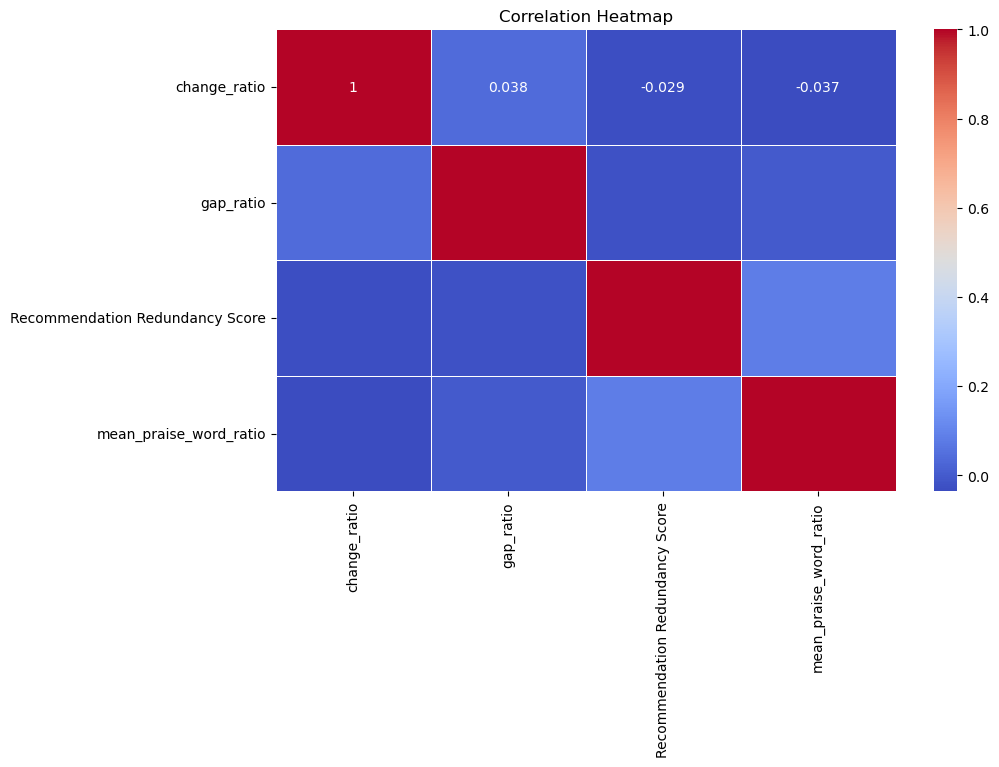

/Users/kaisarimtiyaz/anaconda3/envs/env1/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/kaisarimtiyaz/anaconda3/envs/env1/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/kaisarimtiyaz/anaconda3/envs/env1/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/kaisarimtiyaz/anaconda3/envs/env1/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as

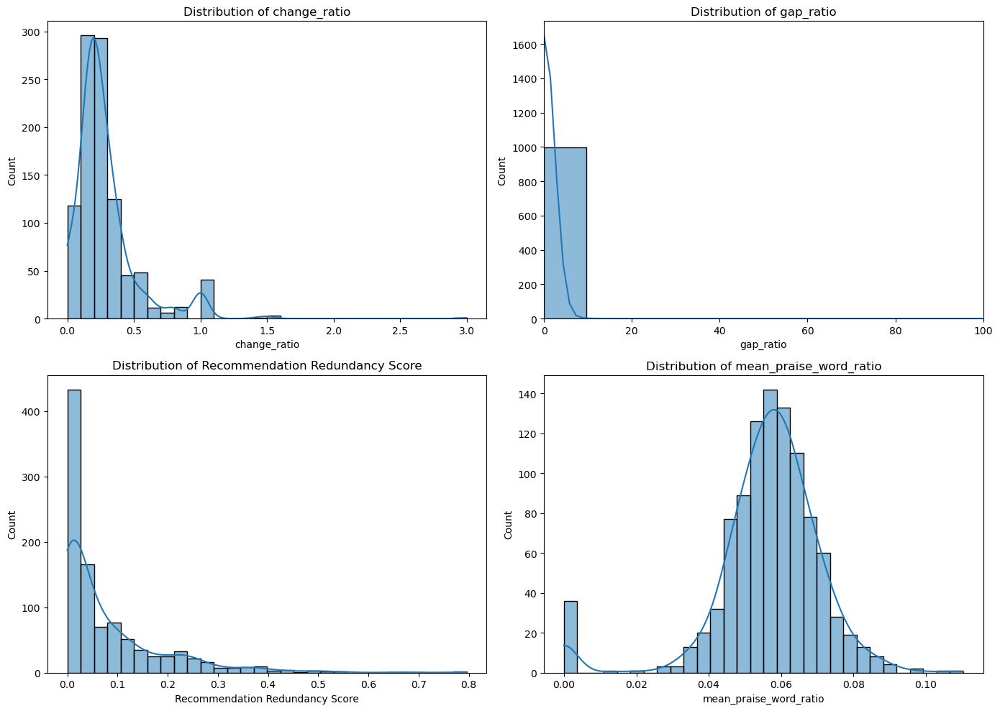

/Users/kaisarimtiyaz/anaconda3/envs/env1/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/kaisarimtiyaz/anaconda3/envs/env1/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/kaisarimtiyaz/anaconda3/envs/env1/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/kaisarimtiyaz/anaconda3/envs/env1/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as

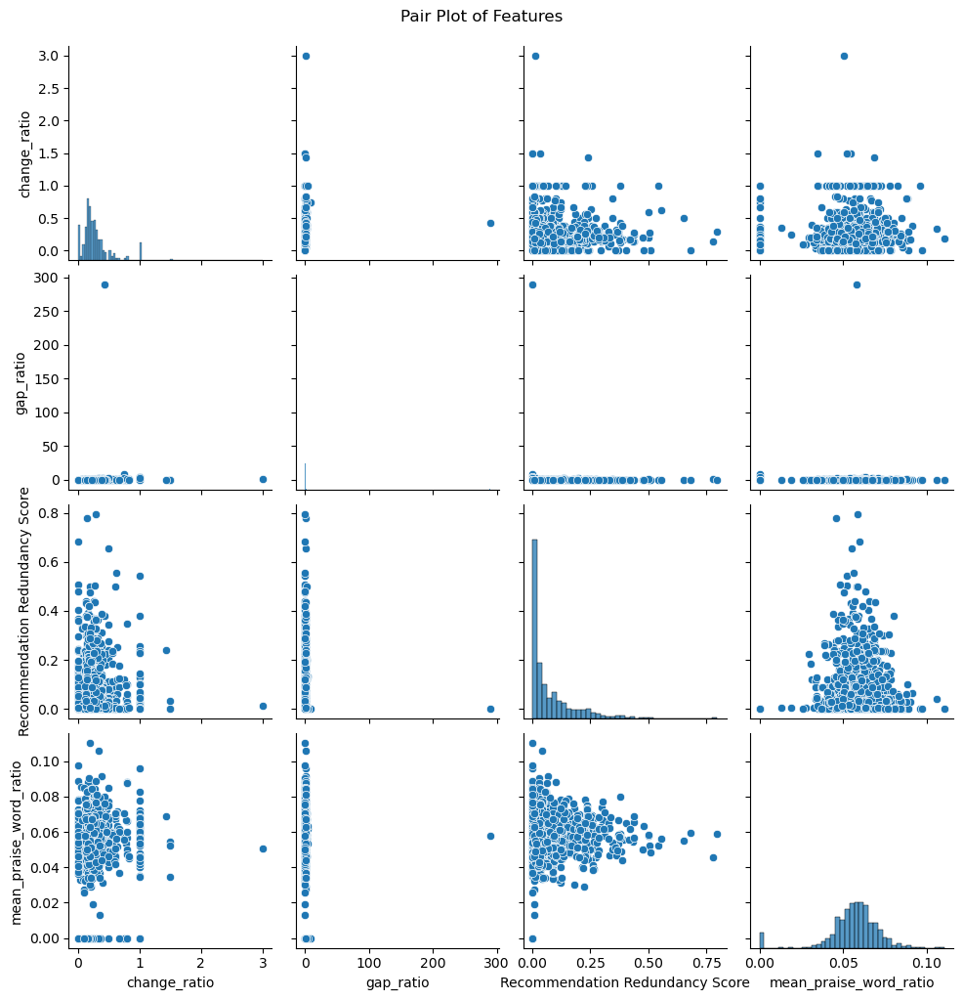

In [518]:
import seaborn as sns
import matplotlib.pyplot as plt



# 1. Correlation Heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(eval_df.corr(), annot=True, cmap='coolwarm', linewidths=0.5)
plt.title("Correlation Heatmap")
plt.show()

# 2. Distribution Plots for each feature, for x axis of gap_ratio use range 0 to 1
plt.figure(figsize=(14, 10))
for i, col in enumerate(eval_df.columns, 1):
    plt.subplot(2, 2, i)
    sns.histplot(eval_df[col], kde=True, bins=30)
    plt.title(f"Distribution of {col}")
    
    # Set x-axis scale between 0 and 1 for subplot (2, 2, 1), which is the first subplot
    if i == 2:  # (2, 2, 1) corresponds to the first subplot
        plt.xlim(0, 100)

plt.tight_layout()
plt.show()

# 3. Pair Plot
sns.pairplot(eval_df)
plt.suptitle("Pair Plot of Features", y=1.02)
plt.show()


In [520]:
#evaluate fraud score by adding the values of all columns in eval_df
final_df['fraud_score'] = eval_df_scaled.sum(axis=1)
#normalize the fraud score using min max scaler

final_df['fraud_score'] = (final_df['fraud_score'] - final_df['fraud_score'].min()) / (final_df['fraud_score'].max() - final_df['fraud_score'].min())

In [521]:
final_df

,experience,total_jobs,user_id,total_experience_time,gap_period,change_ratio,Recommendation Redundancy Score,gap_ratio,mean_praise_word_ratio,gap_time,fraud_score
0,- Bilingual Language Arts Sixth Grade Teacher ...,7,0,16,1,0.437500,0.000000,0.062500,0.044163,1.0,0.327865
1,- Mortgage Banking Default Operations Speciali...,9,1,29,1,0.310345,0.052764,0.034483,0.060315,1.0,0.430017
2,- Guest Lecturer at North Park University (201...,4,2,0,0,0.000000,0.092814,0.000000,0.043121,0.0,0.304549
3,- Accountant at Company Name (November 2013 to...,4,3,19,0,0.210526,0.374447,0.000000,0.058357,0.0,0.641972
4,- Staff Accountant at Cypress Healthcare Partn...,4,4,22,1,0.181818,0.027829,0.045455,0.056519,1.0,0.364873
...,...,...,...,...,...,...,...,...,...,...,...
995,- Culinary Arts Instructor at Company Name (20...,8,995,21,5,0.380952,0.386914,0.238095,0.043802,5.0,0.606803
996,- Middle School Principal at Harper Creek Midd...,4,996,21,9,0.190476,0.006234,0.428571,0.063070,9.0,0.386743
997,- Information Technology Technician I at Compa...,2,997,19,0,0.105263,0.092814,0.000000,0.057690,0.0,0.404848
998,- Dealership Finance Manager at Company Name (...,3,998,21,0,0.142857,0.120643,0.000000,0.050116,0.0,0.392169


In [525]:
final_df[final_df['fraud_score'] > 0.5].count()

experience                         137
total_jobs                         137
user_id                            137
total_experience_time              137
gap_period                         137
change_ratio                       137
Recommendation Redundancy Score    137
gap_ratio                          137
mean_praise_word_ratio             137
gap_time                           137
fraud_score                        137
dtype: int64

### Set an aribitary threshold for now = 0.5

In [526]:
final_df['fraud'] = final_df['fraud_score'].apply(lambda x: 1 if x > 0.5 else 0)

In [527]:
final_df

,experience,total_jobs,user_id,total_experience_time,gap_period,change_ratio,Recommendation Redundancy Score,gap_ratio,mean_praise_word_ratio,gap_time,fraud_score,fraud
0,- Bilingual Language Arts Sixth Grade Teacher ...,7,0,16,1,0.437500,0.000000,0.062500,0.044163,1.0,0.327865,0
1,- Mortgage Banking Default Operations Speciali...,9,1,29,1,0.310345,0.052764,0.034483,0.060315,1.0,0.430017,0
2,- Guest Lecturer at North Park University (201...,4,2,0,0,0.000000,0.092814,0.000000,0.043121,0.0,0.304549,0
3,- Accountant at Company Name (November 2013 to...,4,3,19,0,0.210526,0.374447,0.000000,0.058357,0.0,0.641972,1
4,- Staff Accountant at Cypress Healthcare Partn...,4,4,22,1,0.181818,0.027829,0.045455,0.056519,1.0,0.364873,0
...,...,...,...,...,...,...,...,...,...,...,...,...
995,- Culinary Arts Instructor at Company Name (20...,8,995,21,5,0.380952,0.386914,0.238095,0.043802,5.0,0.606803,1
996,- Middle School Principal at Harper Creek Midd...,4,996,21,9,0.190476,0.006234,0.428571,0.063070,9.0,0.386743,0
997,- Information Technology Technician I at Compa...,2,997,19,0,0.105263,0.092814,0.000000,0.057690,0.0,0.404848,0
998,- Dealership Finance Manager at Company Name (...,3,998,21,0,0.142857,0.120643,0.000000,0.050116,0.0,0.392169,0
